# Import Library

In [87]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pyproj import Proj, Transformer
import plotly.express as px
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score

# Data Preview

In [62]:
accidents_data = pd.read_csv('Accidents.csv')
accidents_data.info()
accidents_data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89632 entries, 0 to 89631
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   OBJECTID      89632 non-null  int64  
 1   acci_id       89618 non-null  float64
 2   Date          89632 non-null  object 
 3   dtg_utc_diff  89632 non-null  object 
 4   Year          89632 non-null  int64  
 5   Month         89632 non-null  int64  
 6   Wk_Yr         89632 non-null  int64  
 7   Julian        89632 non-null  int64  
 8   DoW           89632 non-null  int64  
 9   Hour          89632 non-null  int64  
 10  YMD           89632 non-null  int64  
 11  fatality      89632 non-null  int64  
 12  contrcir1     89632 non-null  object 
 13  xmlretrn      89185 non-null  object 
 14  X             89632 non-null  float64
 15  Y             89632 non-null  float64
dtypes: float64(3), int64(9), object(4)
memory usage: 10.9+ MB


,OBJECTID,acci_id,Date,dtg_utc_diff,Year,Month,Wk_Yr,Julian,DoW,Hour,YMD,fatality,contrcir1,xmlretrn,X,Y
0,1,2.015000e+09,2015/01/01 05:00:00+00,2015/01/01 04:27:00+00,2015,1,1,1,5,0,20150101,0,0,,2025556.88,466548.13
1,2,2.015000e+09,2015/01/01 05:00:00+00,2015/01/01 06:03:00+00,2015,1,1,1,5,2,20150101,0,,,2005237.63,471007.44
2,3,2.015000e+09,2015/01/01 05:00:00+00,2015/01/01 07:25:00+00,2015,1,1,1,5,3,20150101,0,0,,2006018.25,468155.46
3,4,2.015000e+09,2015/01/01 05:00:00+00,2015/01/01 12:09:00+00,2015,1,1,1,5,8,20150101,0,0,,2029973.50,504507.78
4,5,2.015000e+09,2015/01/01 05:00:00+00,2015/01/01 13:29:00+00,2015,1,1,1,5,9,20150101,0,0,,2006420.62,483128.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89627,89628,2.024011e+09,2024/05/09 05:00:00+00,2024/05/10 03:36:00+00,2024,5,19,130,5,23,20240509,0,0,,0.00,0.00
89628,89629,2.024011e+09,2024/05/10 05:00:00+00,2024/05/10 04:48:00+00,2024,5,19,131,6,0,20240510,0,0,,2008366.88,489758.13
89629,89630,2.024011e+09,2024/05/10 05:00:00+00,2024/05/10 15:31:00+00,2024,5,19,131,6,11,20240510,0,0,,2024218.00,472124.06
89630,89631,2.024011e+09,2024/05/10 05:00:00+00,2024/05/10 20:39:00+00,2024,5,19,131,6,16,20240510,0,0,,2003422.88,484097.63


In [63]:
# Explore missing values in the colunms.
accidents_data.isnull().sum()

OBJECTID          0
acci_id          14
Date              0
dtg_utc_diff      0
Year              0
Month             0
Wk_Yr             0
Julian            0
DoW               0
Hour              0
YMD               0
fatality          0
contrcir1         0
xmlretrn        447
X                 0
Y                 0
dtype: int64

# Data Cleaning

In [64]:
# It looks like the acci_id has the same function as OBJECTID, lets simply drop acci_id and set 'OBJECTID' as the new index
# Drop the 'acci_id' column and set 'OBJECTID' as the new index
accidents_data = accidents_data.drop(columns=['acci_id'])


# Verify the changes by displaying the new structure of the dataset
accidents_data_info_final = accidents_data.info()
accidents_data_head_final = accidents_data.head()

(accidents_data_info_final, accidents_data_head_final)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89632 entries, 0 to 89631
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   OBJECTID      89632 non-null  int64  
 1   Date          89632 non-null  object 
 2   dtg_utc_diff  89632 non-null  object 
 3   Year          89632 non-null  int64  
 4   Month         89632 non-null  int64  
 5   Wk_Yr         89632 non-null  int64  
 6   Julian        89632 non-null  int64  
 7   DoW           89632 non-null  int64  
 8   Hour          89632 non-null  int64  
 9   YMD           89632 non-null  int64  
 10  fatality      89632 non-null  int64  
 11  contrcir1     89632 non-null  object 
 12  xmlretrn      89185 non-null  object 
 13  X             89632 non-null  float64
 14  Y             89632 non-null  float64
dtypes: float64(2), int64(9), object(4)
memory usage: 10.3+ MB


(None,
    OBJECTID                    Date            dtg_utc_diff  Year  Month  \
 0         1  2015/01/01 05:00:00+00  2015/01/01 04:27:00+00  2015      1   
 1         2  2015/01/01 05:00:00+00  2015/01/01 06:03:00+00  2015      1   
 2         3  2015/01/01 05:00:00+00  2015/01/01 07:25:00+00  2015      1   
 3         4  2015/01/01 05:00:00+00  2015/01/01 12:09:00+00  2015      1   
 4         5  2015/01/01 05:00:00+00  2015/01/01 13:29:00+00  2015      1   
 
    Wk_Yr  Julian  DoW  Hour       YMD  fatality contrcir1 xmlretrn  \
 0      1       1    5     0  20150101         0      0               
 1      1       1    5     2  20150101         0                      
 2      1       1    5     3  20150101         0      0               
 3      1       1    5     8  20150101         0      0               
 4      1       1    5     9  20150101         0      0               
 
             X          Y  
 0  2025556.88  466548.13  
 1  2005237.63  471007.44  
 2  2006018.25  4

In [65]:
# Count blank values in 'xmlretrn'
blank_count = (accidents_data['xmlretrn'] == ' ').sum()
# Count null values in 'xmlretrn'
null_count = accidents_data['xmlretrn'].isnull().sum()
# Count unique values in 'xmlretrn'
unique_count = accidents_data['xmlretrn'].nunique()
unique_values_xmlretrn = accidents_data['xmlretrn'].unique()
print(unique_values_xmlretrn)
# Print the results
print(f"Blank values in 'xmlretrn': {blank_count}")
print(f"Null values in 'xmlretrn': {null_count}")
print(f"Unique values in 'xmlretrn': {unique_count}")

[' ' nan '107686003' ... '107713067' '107713070' '107714339']
Blank values in 'xmlretrn': 81303
Null values in 'xmlretrn': 447
Unique values in 'xmlretrn': 7668


In [66]:
# The xmlretrn column contains mostly blank entries and a few unique numeric values. Not sure what's the purpose of this column. I'm going to drop it
accidents_data.drop(columns=['xmlretrn'], inplace=True)
accidents_data.head()

,OBJECTID,Date,dtg_utc_diff,Year,Month,Wk_Yr,Julian,DoW,Hour,YMD,fatality,contrcir1,X,Y
0,1,2015/01/01 05:00:00+00,2015/01/01 04:27:00+00,2015,1,1,1,5,0,20150101,0,0,2025556.88,466548.13
1,2,2015/01/01 05:00:00+00,2015/01/01 06:03:00+00,2015,1,1,1,5,2,20150101,0,,2005237.63,471007.44
2,3,2015/01/01 05:00:00+00,2015/01/01 07:25:00+00,2015,1,1,1,5,3,20150101,0,0,2006018.25,468155.46
3,4,2015/01/01 05:00:00+00,2015/01/01 12:09:00+00,2015,1,1,1,5,8,20150101,0,0,2029973.50,504507.78
4,5,2015/01/01 05:00:00+00,2015/01/01 13:29:00+00,2015,1,1,1,5,9,20150101,0,0,2006420.62,483128.40


In [67]:
# Investigate the 'contrcir1' column
unique_values_contr = accidents_data['contrcir1'].unique()
print(unique_values_contr)
unique_values_contr = accidents_data['contrcir1'].value_counts()
print(unique_values_contr)

['0   ' '    ' '2   ' '10  ' '9   ' '4   ' '5   ' '6   ' '7   ' '3   '
 '1   ' '8   ']
0       77881
         9464
10       1231
9         229
2         229
4         200
3         107
6          90
5          77
1          59
7          47
8          18
Name: contrcir1, dtype: int64


In [68]:
# The contrcir1 colunm has a significant portion of values are blank compared to other unique values;
# Due to this significance and unknown meaning of these categorical values, simply drop it or impute them could potentially impact our analysis;
# So I decide to classify them as a new category as 11
# Replace any form of whitespace in 'contrcir1' with '11'
accidents_data['contrcir1'] = accidents_data['contrcir1'].apply(lambda x: '11' if x.strip() == '' else x)
# Re-check the distribution of values in 'contrcir1'
updated_contrcir1_values = accidents_data['contrcir1'].value_counts()
updated_contrcir1_values

0       77881
11       9464
10       1231
9         229
2         229
4         200
3         107
6          90
5          77
1          59
7          47
8          18
Name: contrcir1, dtype: int64

In [69]:
# Convert Date colunm to datetime format
accidents_data['Date'] = pd.to_datetime(accidents_data['Date'])
# View the cleaned dataset
accidents_data.info()
accidents_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89632 entries, 0 to 89631
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   OBJECTID      89632 non-null  int64              
 1   Date          89632 non-null  datetime64[ns, UTC]
 2   dtg_utc_diff  89632 non-null  object             
 3   Year          89632 non-null  int64              
 4   Month         89632 non-null  int64              
 5   Wk_Yr         89632 non-null  int64              
 6   Julian        89632 non-null  int64              
 7   DoW           89632 non-null  int64              
 8   Hour          89632 non-null  int64              
 9   YMD           89632 non-null  int64              
 10  fatality      89632 non-null  int64              
 11  contrcir1     89632 non-null  object             
 12  X             89632 non-null  float64            
 13  Y             89632 non-null  float64            
dtypes: dat

,OBJECTID,Date,dtg_utc_diff,Year,Month,Wk_Yr,Julian,DoW,Hour,YMD,fatality,contrcir1,X,Y
0,1,2015-01-01 05:00:00+00:00,2015/01/01 04:27:00+00,2015,1,1,1,5,0,20150101,0,0,2025556.88,466548.13
1,2,2015-01-01 05:00:00+00:00,2015/01/01 06:03:00+00,2015,1,1,1,5,2,20150101,0,11,2005237.63,471007.44
2,3,2015-01-01 05:00:00+00:00,2015/01/01 07:25:00+00,2015,1,1,1,5,3,20150101,0,0,2006018.25,468155.46
3,4,2015-01-01 05:00:00+00:00,2015/01/01 12:09:00+00,2015,1,1,1,5,8,20150101,0,0,2029973.50,504507.78
4,5,2015-01-01 05:00:00+00:00,2015/01/01 13:29:00+00,2015,1,1,1,5,9,20150101,0,0,2006420.62,483128.40


In [70]:
# Convert 'dtg_utc_diff' to datetime format
accidents_data['dtg_utc_diff'] = pd.to_datetime(accidents_data['dtg_utc_diff'], errors='coerce')

# view the cleaned dataset
accidents_data.info()
accidents_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89632 entries, 0 to 89631
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   OBJECTID      89632 non-null  int64              
 1   Date          89632 non-null  datetime64[ns, UTC]
 2   dtg_utc_diff  89632 non-null  datetime64[ns, UTC]
 3   Year          89632 non-null  int64              
 4   Month         89632 non-null  int64              
 5   Wk_Yr         89632 non-null  int64              
 6   Julian        89632 non-null  int64              
 7   DoW           89632 non-null  int64              
 8   Hour          89632 non-null  int64              
 9   YMD           89632 non-null  int64              
 10  fatality      89632 non-null  int64              
 11  contrcir1     89632 non-null  object             
 12  X             89632 non-null  float64            
 13  Y             89632 non-null  float64            
dtypes: dat

,OBJECTID,Date,dtg_utc_diff,Year,Month,Wk_Yr,Julian,DoW,Hour,YMD,fatality,contrcir1,X,Y
0,1,2015-01-01 05:00:00+00:00,2015-01-01 04:27:00+00:00,2015,1,1,1,5,0,20150101,0,0,2025556.88,466548.13
1,2,2015-01-01 05:00:00+00:00,2015-01-01 06:03:00+00:00,2015,1,1,1,5,2,20150101,0,11,2005237.63,471007.44
2,3,2015-01-01 05:00:00+00:00,2015-01-01 07:25:00+00:00,2015,1,1,1,5,3,20150101,0,0,2006018.25,468155.46
3,4,2015-01-01 05:00:00+00:00,2015-01-01 12:09:00+00:00,2015,1,1,1,5,8,20150101,0,0,2029973.50,504507.78
4,5,2015-01-01 05:00:00+00:00,2015-01-01 13:29:00+00:00,2015,1,1,1,5,9,20150101,0,0,2006420.62,483128.40


In [71]:
# Check for zero values in 'X' and 'Y'
zero_x_count = (accidents_data['X'] == 0).sum()
zero_y_count = (accidents_data['Y'] == 0).sum()

# Check for null values in 'X' and 'Y'
null_x_count = accidents_data['X'].isnull().sum()
null_y_count = accidents_data['Y'].isnull().sum()

print(f"Zero values in 'X': {zero_x_count}")
print(f"Zero values in 'Y': {zero_y_count}")
print(f"Null values in 'X': {null_x_count}")
print(f"Null values in 'Y': {null_y_count}")

Zero values in 'X': 903
Zero values in 'Y': 903
Null values in 'X': 0
Null values in 'Y': 0


In [72]:
# Remove rows where 'X' or 'Y' are zero
accidents_data = accidents_data[(accidents_data['X'] != 0) & (accidents_data['Y'] != 0)]

# Verify the removal by checking for zero values again
zero_x_count_post = (accidents_data['X'] == 0).sum()
zero_y_count_post = (accidents_data['Y'] == 0).sum()

print(f"Zero values in 'X' after removal: {zero_x_count_post}")
print(f"Zero values in 'Y' after removal: {zero_y_count_post}")

Zero values in 'X' after removal: 0
Zero values in 'Y' after removal: 0


In [73]:
# Convert X and Y from UTM to WGS 84 latitude and longitude coordinates for future map operations

# Define the projection transformer from UTM Zone 17N to WGS 84
transformer = Transformer.from_crs('epsg:3632', 'epsg:4326', always_xy=True)

# Define a function to apply transformation
def convert_coordinates(row):
    lon, lat = transformer.transform(row['X'], row['Y'])
    return pd.Series([lon, lat], index=['longitude', 'latitude'])

# Apply the conversion function to the entire DataFrame
accidents_data[['longitude', 'latitude']] = accidents_data.apply(convert_coordinates, axis=1)

# Check the first few entries to confirm the conversion
print(accidents_data[['longitude', 'latitude']].head())

   longitude   latitude
0 -78.914625  35.031896
1 -78.982501  35.044178
2 -78.979894  35.036341
3 -78.899743  35.136187
4 -78.978539  35.077483


# Data Visualization and Explore

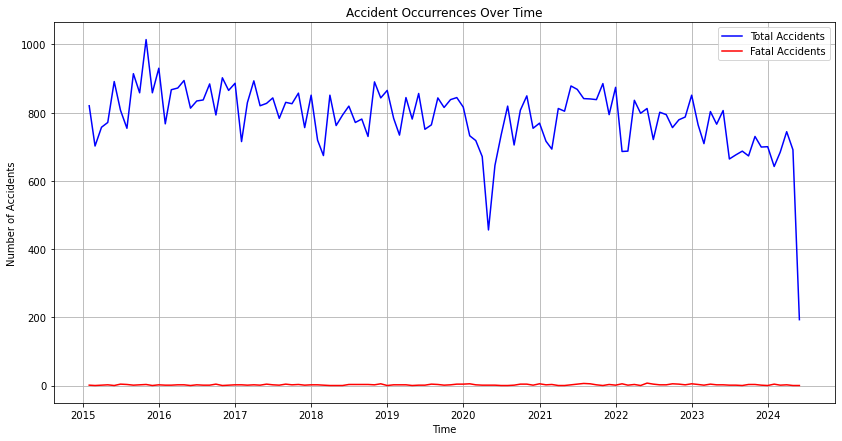

In [74]:
# Resample data based on 'dtg_utc_diff' to count total and fatal accidents monthly
time_series_data = accidents_data.set_index('dtg_utc_diff').resample('M').agg({
    'OBJECTID': 'count',  # Total accidents per month
    'fatality': lambda x: (x == 1).sum()  # Fatal accidents per month
}).rename(columns={'OBJECTID': 'Total Accidents', 'fatality': 'Fatal Accidents'})

# Plotting the time series data
plt.figure(figsize=(14, 7))
plt.plot(time_series_data.index, time_series_data['Total Accidents'], label='Total Accidents', color='blue')
plt.plot(time_series_data.index, time_series_data['Fatal Accidents'], label='Fatal Accidents', color='red')
plt.title('Accident Occurrences Over Time')
plt.xlabel('Time')
plt.ylabel('Number of Accidents')
plt.legend()
plt.grid(True)
plt.show()

### 
The first significant dip of low number of accidents happened between 2020 to 2021, this is mainly because it's COVID-19 era and the state implemented control measures that resulting low traffic during that period of time.
The second significant decrease is after 2024, this mainly because incomplete data collection of this year.
Lets anotate both of them on the graph for more clear representations.


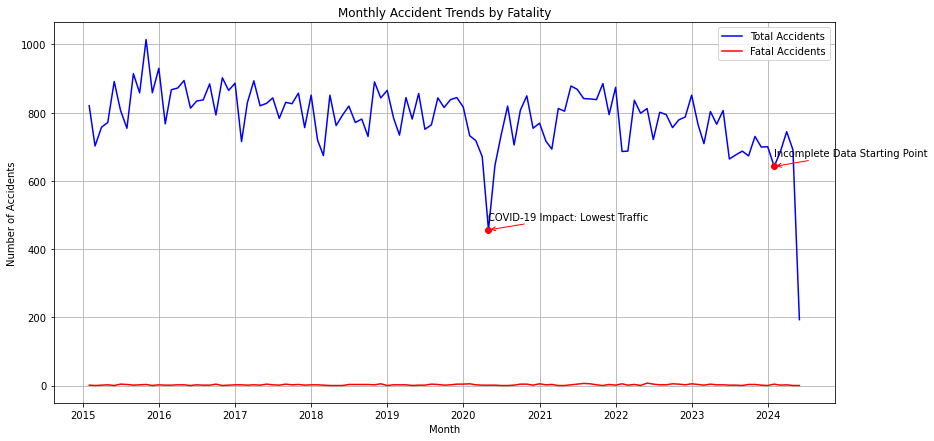

In [75]:
# Define the time periods
covid_period_start = pd.Timestamp('2020-01-01', tz='UTC')
covid_period_end = pd.Timestamp('2021-01-01', tz='UTC')
incomplete_data_start = pd.Timestamp('2024-01-01', tz='UTC')
incomplete_data_end = pd.Timestamp('2024-05-10', tz='UTC')

# Find the minimum points within these periods
covid_min_date = time_series_data.loc[covid_period_start:covid_period_end, 'Total Accidents'].idxmin()
covid_min_value = time_series_data.loc[covid_min_date, 'Total Accidents']

incomplete_data_min_date = time_series_data.loc[incomplete_data_start:incomplete_data_end, 'Total Accidents'].idxmin()
incomplete_data_min_value = time_series_data.loc[incomplete_data_min_date, 'Total Accidents']

# Plotting
plt.figure(figsize=(14, 7))
plt.plot(time_series_data.index, time_series_data['Total Accidents'], label='Total Accidents', color='blue')
plt.plot(time_series_data.index, time_series_data['Fatal Accidents'], label='Fatal Accidents', color='red')

# Annotations
plt.scatter([covid_min_date, incomplete_data_min_date], [covid_min_value, incomplete_data_min_value],
            color='red', marker='o', zorder=5)
plt.annotate('COVID-19 Impact: Lowest Traffic',
             xy=(covid_min_date, covid_min_value),
             xytext=(covid_min_date, covid_min_value + 30),

             arrowprops=dict(arrowstyle="->", color='red'))

plt.annotate('Incomplete Data Starting Point',
             xy=(incomplete_data_min_date, incomplete_data_min_value),
             xytext=(incomplete_data_min_date, incomplete_data_min_value + 30),

             arrowprops=dict(arrowstyle="->", color='red'))

plt.title('Monthly Accident Trends by Fatality')
plt.xlabel('Month')
plt.ylabel('Number of Accidents')
plt.legend()
plt.grid(True)
plt.show()


### 
To avoid the impact from covid-19 abnormality and the incompletion dataset from 2024, I'll break down the datasets to prior COVID from 20150101 to 20191231, post COVID from 20210101 to 20231231 to analyze the accident under normal conditions.

In [76]:
# Filter the data for the specified ranges

# Filtering the Pre-COVID data
pre_covid_data = accidents_data[(accidents_data['dtg_utc_diff'] >= '2015-01-01') 
                                & (accidents_data['dtg_utc_diff'] <= '2019-12-31')]

# Filtering the Post-COVID data
post_covid_data = accidents_data[(accidents_data['dtg_utc_diff'] >= '2021-01-01') 
                                 & (accidents_data['dtg_utc_diff'] <= '2023-12-31')]


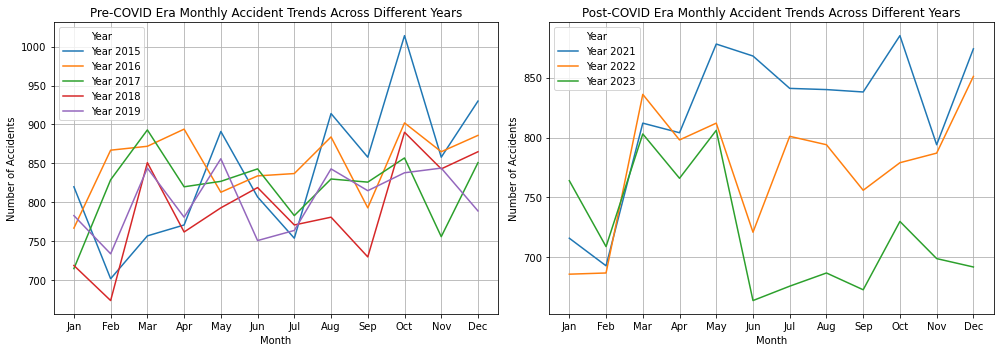

In [77]:
# Lets drill down to monthly accidents changes to see the seasonal pattern

# Group the data by year and month and count the number of accidents in each group
monthly_accidents_pre_covid = pre_covid_data.groupby([pre_covid_data['dtg_utc_diff'].dt.year, 
                                                      pre_covid_data['dtg_utc_diff'].dt.month]).count()['OBJECTID'].unstack(0)
monthly_accidents_post_covid = post_covid_data.groupby([post_covid_data['dtg_utc_diff'].dt.year, 
                                                        post_covid_data['dtg_utc_diff'].dt.month]).count()['OBJECTID'].unstack(0)
# Set up a figure with two subplots (one for Pre-COVID and one for Post-COVID) horizontally aligned
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 5))

# Plotting Pre-COVID data
for year in monthly_accidents_pre_covid.columns:
    axes[0].plot(monthly_accidents_pre_covid.index, monthly_accidents_pre_covid[year], label=f'Year {year}')
axes[0].set_title('Pre-COVID Era Monthly Accident Trends Across Different Years')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Number of Accidents')
axes[0].set_xticks(range(1, 13))
axes[0].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
axes[0].legend(title='Year')
axes[0].grid(True)

# Plotting Post-COVID data
for year in monthly_accidents_post_covid.columns:
    axes[1].plot(monthly_accidents_post_covid.index, monthly_accidents_post_covid[year], label=f'Year {year}')
axes[1].set_title('Post-COVID Era Monthly Accident Trends Across Different Years')
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Number of Accidents')
axes[1].set_xticks(range(1, 13))
axes[1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
axes[1].legend(title='Year')
axes[1].grid(True)

# Display the plot
plt.tight_layout()
plt.show()

### 
We can see the total number of accidents are slightly decreased each year, this indicates our city is generally proceeding to a better and safer place for road traffic.
We can see that there are certain months accidents will increase significantly, such as Feb to Mar, Apr to May, and will continually increase slightly from Jun till Dec.
We can see that from Jan to Feb the number of accidents will decrease significantly as well as Jun to Jul, Oct to Nov.
My assumption of these observations is that:1. Seasonal Weather condition can significantly impact driving conditions. For instance, rainy or icy conditions might contribute accidents rate. 2.Vacation season and tourist season: Fayetteville is near several military bases and historic sites, might experience seasonal tourist inflows. 3. Behavioral factors: during holidays, increased alcohol consumption might also lead to spikes in accident.
From online research, I'm not able to find local weather data, traffic volume statistics or possible behavioral studies to further substantiate these hypotheses, however, I can continue to mine the data to drill down more on specific period and locations to identify high risk area for better deployment strategy.


In [78]:
# First, lets combine pre-covid and post-covid data together to ensure there's no outlier's influence.

# Combine pre-COVID and post-COVID data
combined_data = pd.concat([pre_covid_data, post_covid_data])

# Ensure the data is sorted by date if necessary
combined_data.sort_values('dtg_utc_diff', inplace=True)

# Reset index for the new combined dataframe
combined_data.reset_index(drop=True, inplace=True)


In [79]:
# Drop rows where longitude or latitude are NaN or infinite
combined_data = combined_data[(combined_data['X'].notnull()) & (combined_data['Y'].notnull())]
combined_data= combined_data[np.isfinite(combined_data['X']) & np.isfinite(combined_data['Y'])]

In [80]:
# Plot on map to see hotspots.

# Create new column 'month' for visualizing different hotspot by month difference
combined_data['month'] = combined_data['dtg_utc_diff'].dt.month
# Define a color map by month, to visualize and identify hot spot.
fig = px.scatter_mapbox(combined_data, lat="latitude", lon="longitude",
                        color=combined_data['month'].astype(str),  # Convert month to string for discrete color scale
                        labels={'color': 'Month of Accident'},
                        hover_data={"OBJECTID": True, "month": True},
                        zoom=10, center={"lat": combined_data['latitude'].mean(), "lon": combined_data['longitude'].mean()},
                        height=600)

# Update mapbox style to a publicly available style
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

# Show the figure
fig.show()

### 
This visualization is hard to interpretate due to the density. I'm going to group the accident location into bins to represent "hot" spots by month on the heat map. In this step, each bin represents approximately 1.11 km by 1.11 km area. In this way, the Fayetteville PD is able to see where are the hot spots at across the year. Potentially, they could allocate resources to be able to respond to accidents quicker and more efficient. 

In [81]:
# Visualize hotspots changes per each month.

# Create grid bins
combined_data['latbin'] = np.floor(combined_data['latitude'] * 100) / 100
combined_data['lonbin'] = np.floor(combined_data['longitude'] * 100) / 100
# Convert 'month' to string for better handling in Plotly

# Aggregate data by bins and month
binned_data = combined_data.groupby(['latbin', 'lonbin', 'month']).size().reset_index(name='counts')
# Sort binned_data by 'month' to ensure the animation frames are in the correct order
binned_data = binned_data.sort_values('month')

# Visualize using Plotly
fig = px.density_mapbox(binned_data, lat='latbin', lon='lonbin', z='counts', radius=12,
                        center={"lat": combined_data['latitude'].mean(), "lon": combined_data['longitude'].mean()},
                        zoom=10, mapbox_style="open-street-map",
                        animation_frame='month',  # Ensure this is the string-typed 'month'
                        range_color=[0, binned_data['counts'].max()],
                        title='Interactive Visualization of Accident Hotspots by Month')

# Update layout if needed
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

# Show the figure
fig.show()

In [82]:
# Visualize hotspots changes per different time in a 24 hours timeframe.

# Create new feature 'hour' from extraction of dtg_utc_diff.
combined_data['hour'] = combined_data['dtg_utc_diff'].dt.hour
# Aggregate data by bins and month
binned_data = combined_data.groupby(['latbin', 'lonbin', 'hour']).size().reset_index(name='counts')
# Sort binned_data by 'month' to ensure the animation frames are in the correct order
binned_data = binned_data.sort_values('hour')

# Visualize using Plotly
fig = px.density_mapbox(binned_data, lat='latbin', lon='lonbin', z='counts', radius=12,
                        center={"lat": combined_data['latitude'].mean(), "lon": combined_data['longitude'].mean()},
                        zoom=10, mapbox_style="open-street-map",
                        animation_frame='hour',  # Ensure this is the string-typed 'month'
                        range_color=[0, binned_data['counts'].max()],
                        title='Interactive Visualization of Accident Hotspots by Month')

# Update layout if needed
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

# Show the figure
fig.show()

### 
We can see that Multiple hot spots are generally similar across the year, such as the intersection of Skibo Road and Cliffdale Road, which is accurate that I personally encountered accidents happened at that intersection since I moved to this City. My assumption is that if certain hotspots are always there across the year, that indicates it possibly because of the route usage or road conditions that lead to it high rate of accidents. More research needs to be done to find the root cause and implement preventative measures to lower the accident chance. Furthermore, different month indeed has different hot spots showing respectively, which indicates the contribution of seasonal factors to the total number of accidents in certain areas. For instance, between June and December, the accidents on the same intersection mentioned before increased almost 30%.
Accidents rate start increasing from 11 am and reach at the highest rate from 4 pm to 9 pm.
These hotspots does not necessarily represent accurate center of the accident hubs, but it can be utilized for better resource allocation in conjunction with field investigation and expertise. 


# Adding feature ‘is_hotspot’. I need this binary feature to be used for our model to predict as the Y value. The goal here is to we will have necessary features to develop model to predict most likely hotspots so the FPD can pre-deploy officers to prevent accidents from occurring.

### Adding feature is_hotspot

In [83]:
# Create more Accurate daytime features
combined_data['day'] = combined_data['dtg_utc_diff'].dt.day
combined_data['hour'] = combined_data['dtg_utc_diff'].dt.hour
combined_data['month'] = combined_data['dtg_utc_diff'].dt.month
# Aggregate data to count accidents per spatial-temporal bin
aggregated_data = combined_data.groupby(['latbin', 'lonbin', 'hour','month']).size().reset_index(name='counts')

# Define a threshold to identify hotspots
threshold = 9 # If a area has more than 9 accidents per that hour in that particular month, I called it hotspot.

# Create the target variable
aggregated_data['is_hotspot'] = (aggregated_data['counts'] >= threshold).astype(int)

In [84]:
# Count the number of hotspots and non-hotspots
hotspot_counts = aggregated_data['is_hotspot'].value_counts()

# Print the counts
print(hotspot_counts)

0    27325
1     1409
Name: is_hotspot, dtype: int64


### Feature selection

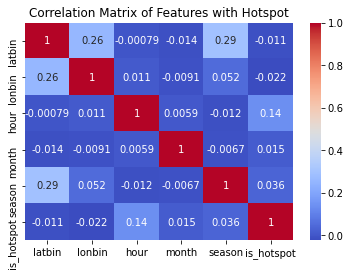

In [85]:
#adding a simple seasonality feature
aggregated_data['season'] = combined_data['month'].apply(lambda x: (x%12 + 3)//3)
# Correlation matrix
feature_cols = ['latbin', 'lonbin', 'hour', 'month', 'season']
corr_matrix = aggregated_data[feature_cols + ['is_hotspot']].corr()

# Plotting the correlation matrix
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Features with Hotspot')
plt.show()


#### Because the corr values do not present a significant differences here, intuitively, I think the location (latbin, lonbin) and the time when the accidents happened should all matters to whether a certain area was a hotspot or not. Therefore, I select all features for our model development.

### Model Development

Results from model:  Logistic Regression
              precision    recall  f1-score   support

 Non-Hotspot       0.95      1.00      0.97      8179
     Hotspot       0.00      0.00      0.00       442

    accuracy                           0.95      8621
   macro avg       0.47      0.50      0.49      8621
weighted avg       0.90      0.95      0.92      8621

Accuracy: 0.949
Precision: 0.900
Recall: 0.949
F1 Score: 0.924


C:\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



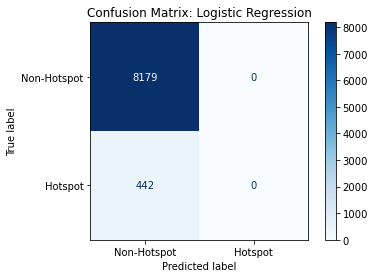



Results from model:  Random Forest
              precision    recall  f1-score   support

 Non-Hotspot       0.97      0.99      0.98      8179
     Hotspot       0.72      0.53      0.61       442

    accuracy                           0.97      8621
   macro avg       0.85      0.76      0.80      8621
weighted avg       0.96      0.97      0.96      8621

Accuracy: 0.965
Precision: 0.962
Recall: 0.965
F1 Score: 0.963


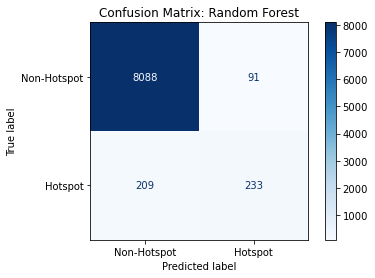



Results from model:  Gradient Boosting Machine
              precision    recall  f1-score   support

 Non-Hotspot       0.97      0.99      0.98      8179
     Hotspot       0.70      0.51      0.59       442

    accuracy                           0.96      8621
   macro avg       0.84      0.75      0.79      8621
weighted avg       0.96      0.96      0.96      8621

Accuracy: 0.964
Precision: 0.960
Recall: 0.964
F1 Score: 0.961


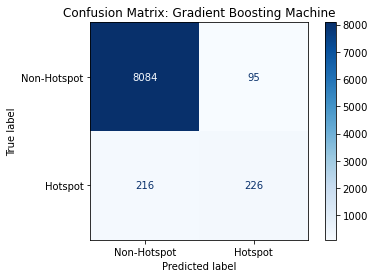

In [86]:
# Define features and target
X = aggregated_data[['latbin', 'lonbin', 'hour','month','season']]
y = aggregated_data['is_hotspot']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize models
log_reg = LogisticRegression(max_iter=10000, random_state=42)
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
gbm = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=8, random_state=42)

# List of models
models = [log_reg, random_forest, gbm]
model_names = ['Logistic Regression', 'Random Forest', 'Gradient Boosting Machine']

# Train and evaluate models
for model, name in zip(models, model_names):
    model.fit(X_train, y_train)  # Train model
    y_pred = model.predict(X_test)  # Predict on test set
    
    print("Results from model: ", name)
    
    # Printing the classification report including metrics such as precision, recall, and F1-score
    print(classification_report(y_test, y_pred, target_names=['Non-Hotspot', 'Hotspot']))
    
    # Calculating additional classification metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)
    
    # Printing calculated metrics
    print(f"Accuracy: {accuracy:.3f}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall: {recall:.3f}")
    print(f"F1 Score: {f1:.3f}")
    
    # Calculate and display the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Hotspot', 'Hotspot'])

    # Display the confusion matrix
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix: {name}')
    plt.show()
    
    print("\n")

### Cross-Validation

In [88]:
# Logistic Regression
log_reg = LogisticRegression(max_iter=10000, random_state=42)

# Random Forest 
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)

# Gradient Boosting Machine
gbm = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=8, random_state=42)
# Define features and target
X = aggregated_data[['latbin', 'lonbin', 'hour','month','season']]
y = aggregated_data['is_hotspot']

# Logistic Regression
log_reg_scores = cross_val_score(log_reg, X, y, cv=10, scoring='accuracy')
print("Logistic Regression - Accuracy for each fold:", log_reg_scores)
print("Logistic Regression - Mean accuracy: %0.2f (+/- %0.2f)" % (log_reg_scores.mean(), log_reg_scores.std() * 2))

# Random Forest
rf_scores = cross_val_score(random_forest, X, y, cv=10, scoring='accuracy')
print("Random Forest - Accuracy for each fold:", rf_scores)
print("Random Forest - Mean accuracy: %0.2f (+/- %0.2f)" % (rf_scores.mean(), rf_scores.std() * 2))

# Gradient Boosting Machine
gbm_scores = cross_val_score(gbm, X, y, cv=10, scoring='accuracy')
print("Gradient Boosting Machine - Accuracy for each fold:", gbm_scores)
print("Gradient Boosting Machine - Mean accuracy: %0.2f (+/- %0.2f)" % (gbm_scores.mean(), gbm_scores.std() * 2))


Logistic Regression - Accuracy for each fold: [0.95093946 0.95093946 0.95093946 0.95093946 0.95127045 0.95092238
 0.95092238 0.95092238 0.95092238 0.95092238]
Logistic Regression - Mean accuracy: 0.95 (+/- 0.00)
Random Forest - Accuracy for each fold: [0.95163535 0.70424495 0.75608907 0.65831594 0.63139575 0.69544031
 0.35885834 0.69404803 0.77584407 0.95092238]
Random Forest - Mean accuracy: 0.72 (+/- 0.32)
Gradient Boosting Machine - Accuracy for each fold: [0.95163535 0.59464161 0.62386917 0.61551844 0.60946746 0.73894883
 0.48172642 0.69161156 0.67490428 0.95092238]
Gradient Boosting Machine - Mean accuracy: 0.69 (+/- 0.29)


#### We employed k-fold cross-validation, particularly useful in assessing the effectiveness and robustness of each model across different subsets of the data. This method helps in understanding how the model performs in various scenarios and reduces the variance of model performance estimation. Although 

### Model Performance Results
Overall Performance:

After comparing the results of the Random Forest algorithm with other models, it has proven to be the most effective in predicting the hotspot status. It outperforms the other models, particularly in terms of overall accuracy and precision.

Accuracy: 96.5% overall accuracy indicates that the model is correctly predicting the hotspot status (either hotspot or not) for about 96.5% of the cases in the test set.

Class-Specific Performance:

    Class 0 (Non-hotspots):
        Precision: 0.97 indicates that when the model predicts an area is not a hotspot, it is correct about 97% of the time.
        Recall: 0.99 indicates that the model successfully identifies 99% of all actual non-hotspots.
        F1-Score: 0.98 reflects balanced accuracy indicating excellent performance.

    Class 1 (Hotspots):
        Precision: 0.72 shows that when the model predicts an area as a hotspot, it is correct about 72% of the time.
        Recall: 0.53 indicates that the model identifies 53% of all actual hotspots, suggesting areas for potential improvement.
        F1-Score: 0.61 reflects fairly decent balanced accuracy concerning hotspot predictions.

Confusion Matrix Analysis

    True Negatives (TN = 8088): Non-hotspots correctly identified.
    False Positives (FP = 91): Non-hotspots incorrectly labeled as hotspots.
    False Negatives (FN = 209): Hotspots missed by the model.
    True Positives (TP = 233): Hotspots correctly identified.

The overall model performance shows 96.5% accuracy which indicates an excellent overall performance, with particularly strong results in identifying non-hotspots. The performance metrics for hotspots, while lower, still provide a robust base for targeted improvements.

### Summary

1. Data Preprocessing and Binning:
Significant effort was devoted to preprocessing the data to render it suitable for analysis. This involved converting X and Y columns from UTM to WGS 84 latitude and longitude coordinates after extensive research. Additionally, I created spatial-temporal bins to reformat the raw accident data for machine learning applications. Adjusting the sizes of these bins was crucial to accurately reflect the geographic density and distribution of accidents.

2. Feature Engineering:
Beyond basic preprocessing, I enhanced the dataset with new features derived from the dtg_utc_diff datetime column. This enhancement was key in capturing more precise temporal patterns, which are essential for accurately predicting accident hotspots.

3. Exploratory Data Analysis (EDA):
The exploratory analysis was geared towards understanding the distribution of accidents within the spatial-temporal bins. Determining the appropriate threshold for hotspot identification was the most significant for modeling building, as it shifted our approach from regression to binary classification. In this step, bins with accident counts surpassing this threshold were classified as hotspots.

4. Model Comparison and Evaluation:
The performance of three predictive models—Logistic Regression, Random Forest, and Gradient Boosting Machine (GBM)—was evaluated. Logistic Regression served as a basic model, achieving moderate success and underscoring the potential of more complex models. The Random Forest model excelled in capturing non-linear relationships and feature interactions. However, the GBM emerged as the most effective, indicating a balance in detecting hotspot and non-hotspot classes and showing better performance metrics across precision, recall, F1-score, and accuracy.

### Recommendations for Future Work

1.	Incorporate External Data: If resources are available, integrating additional data sources would potentially improve the overall model predictive power. These data sources include weather conditions, traffic volume, or holiday special events that can influence accident rates.
2.	Spatial Features: Maybe we should consider more detailed geographic features such as proximity to schools, major intersections, or road work zones.
3.	Model Enhancement: Experiment with deep learning approaches could potentially capture more complex patterns that those traditional models might miss.
4.	Ensemble Techniques: Explore stacking or blending different models to leverage the strengths of each model. I tried DBSCAN for initial accidents clustering, but due to memory limitation it will not complete the task.
5.	Real-time Testing: test the model in a real-time setting to validate its practical effectiveness in operational environments.


### Recommendations for FPD Implementation

1.	Strategic Resource Allocation: Use model predictions to dynamically allocate resources during high-risk times or in high-risk areas, ensuring that patrols and emergency response teams are more effectively distributed.
2.	Preventive Measures: Implement preventive measures such as traffic lights, speed bumps, or signs in areas frequently predicted as hotspots.
3.	Community Engagement: Launch community awareness campaigns about high-risk areas and times, educating the public on safe driving practices.
4.	Infrastructure Adjustments: prioritized infrastructure upgrades in identified hotspots, such as improving road lighting, signage, and surface conditions.
5.	Continuous Monitoring and Feedback: Feedback System: Establish a feedback loop with patrol officers and emergency responders to continually refine the hotspot predictions based on ground realities. Ongoing Evaluation: Regularly evaluate the impact of deployed measures and model-based deployments on accident rates and resource utilization.
